<a href="https://colab.research.google.com/github/G-Gaddu/Quant-Material/blob/main/Fama_French_5_Factor_on_NIFTY50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [79]:
# Import the necessary packages
import yfinance as yf
import numpy as np
import datetime
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

In [80]:
# Download the closing prices from the Nifty50 from Yahoofinance for each stock from the last 8 years
nifty50 = ["ADANIENT.NS", "ADANIPORTS.NS", "APOLLOHOSP.NS", "ASIANPAINT.NS", "AXISBANK.NS",
           "BAJAJ-AUTO.NS", "BAJFINANCE.NS", "BAJAJFINSV.NS", "BPCL.NS", "BHARTIARTL.NS",
           "BRITANNIA.NS", "CIPLA.NS", "COALINDIA.NS", "DIVISLAB.NS", "DRREDDY.NS",
           "EICHERMOT.NS", "GRASIM.NS", "HCLTECH.NS", "HDFCBANK.NS", "HDFCLIFE.NS",
           "HEROMOTOCO.NS", "HINDALCO.NS", "HINDUNIVER.NS", "ICICIBANK.NS", "ITC.NS",
           "INDUSINDBK.NS", "INFRATEL.NS", "JSWSTEEL.NS", "KOTAKBANK.NS", "LT.NS",
           "M&M.NS", "MARUTI.NS", "NESTLEIND.NS", "NTPC.NS", "ONGC.NS", "POWERGRID.NS",
           "RELIANCE.NS", "SBILIFE.NS", "SBIN.NS", "SUNPHARMA.NS", "TCS.NS",
           "TATACONSUM.NS", "TATAMOTORS.NS", "TATASTEEL.NS", "TECHM.NS", "TITAN.NS",
           "ULTRACEMCO.NS", "UPL.NS", "WIPRO.NS"]

end = datetime.date.today()
start = end - pd.DateOffset(years=20)

df = pd.DataFrame()

for stock in nifty50:
  df[stock] = yf.download(stock, start, end)["Adj Close"]
df.head()


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

,ADANIENT.NS,ADANIPORTS.NS,APOLLOHOSP.NS,ASIANPAINT.NS,AXISBANK.NS,BAJAJ-AUTO.NS,BAJFINANCE.NS,BAJAJFINSV.NS,BPCL.NS,BHARTIARTL.NS,...,SUNPHARMA.NS,TCS.NS,TATACONSUM.NS,TATAMOTORS.NS,TATASTEEL.NS,TECHM.NS,TITAN.NS,ULTRACEMCO.NS,UPL.NS,WIPRO.NS
Date,,,,,,,,,,,,,,,,,,,,,
2004-09-06,3.545219,NaN,97.747208,25.202526,21.522751,148.602585,6.954054,906.440063,12.931070,56.429688,...,30.807310,90.682915,31.471420,62.572830,5.828581,NaN,6.208668,242.482895,35.045654,54.583324
2004-09-07,3.528010,NaN,97.659164,25.325462,21.289745,146.539429,7.544180,893.855408,13.011424,55.928467,...,30.208605,90.750366,31.257263,62.620739,5.891998,NaN,6.249552,242.071609,36.108879,55.349724
2004-09-08,3.550956,NaN,96.206825,25.305635,21.229336,147.045166,7.438236,896.940430,13.164477,56.993568,...,31.297533,90.577187,31.191919,63.738541,5.962332,NaN,6.169561,240.791977,37.985161,55.148781
2004-09-09,3.525141,NaN,96.338875,25.226318,20.875519,146.354767,7.260288,892.729065,13.030555,55.489891,...,30.730965,89.324791,30.985016,63.051903,5.924284,NaN,6.033133,233.982758,36.848507,55.148781
2004-09-10,3.548088,NaN,96.536903,25.047857,20.659773,147.847977,7.483758,892.729065,13.013336,57.975132,...,30.630505,90.130554,31.130215,63.187634,6.075330,NaN,5.949141,236.359146,36.908333,55.260937


In [81]:
# Count NaNs for each column
nan_counts = df.isnull().sum()
print(nan_counts)
# Iterate over columns and apply NaN handling logic
for col in df.columns:
  if nan_counts[col] > 250:
    df.drop(col, axis=1, inplace=True)
  else:
    if df[col].isnull().iloc[0]:
      df[col].fillna(method='bfill', inplace=True)
    else:
      df[col].fillna(method='ffill', inplace=True)


ADANIENT.NS         0
ADANIPORTS.NS     806
APOLLOHOSP.NS       0
ASIANPAINT.NS       0
AXISBANK.NS         0
BAJAJ-AUTO.NS       0
BAJFINANCE.NS       0
BAJAJFINSV.NS       1
BPCL.NS             0
BHARTIARTL.NS       0
BRITANNIA.NS        0
CIPLA.NS            0
COALINDIA.NS     1529
DIVISLAB.NS         0
DRREDDY.NS          0
EICHERMOT.NS        0
GRASIM.NS           0
HCLTECH.NS          0
HDFCBANK.NS         0
HDFCLIFE.NS      3261
HEROMOTOCO.NS       0
HINDALCO.NS         0
HINDUNIVER.NS    4938
ICICIBANK.NS        0
ITC.NS              0
INDUSINDBK.NS       0
INFRATEL.NS      4938
JSWSTEEL.NS         0
KOTAKBANK.NS        0
LT.NS               0
M&M.NS              0
MARUTI.NS           0
NESTLEIND.NS        0
NTPC.NS            43
ONGC.NS             0
POWERGRID.NS      770
RELIANCE.NS         0
SBILIFE.NS       3229
SBIN.NS             0
SUNPHARMA.NS        0
TCS.NS              0
TATACONSUM.NS       0
TATAMOTORS.NS       0
TATASTEEL.NS        0
TECHM.NS          495
TITAN.NS  

In [82]:
nan_counts = df.isnull().sum()
print(nan_counts)

ADANIENT.NS      0
APOLLOHOSP.NS    0
ASIANPAINT.NS    0
AXISBANK.NS      0
BAJAJ-AUTO.NS    0
BAJFINANCE.NS    0
BAJAJFINSV.NS    0
BPCL.NS          0
BHARTIARTL.NS    0
BRITANNIA.NS     0
CIPLA.NS         0
DIVISLAB.NS      0
DRREDDY.NS       0
EICHERMOT.NS     0
GRASIM.NS        0
HCLTECH.NS       0
HDFCBANK.NS      0
HEROMOTOCO.NS    0
HINDALCO.NS      0
ICICIBANK.NS     0
ITC.NS           0
INDUSINDBK.NS    0
JSWSTEEL.NS      0
KOTAKBANK.NS     0
LT.NS            0
M&M.NS           0
MARUTI.NS        0
NESTLEIND.NS     0
NTPC.NS          0
ONGC.NS          0
RELIANCE.NS      0
SBIN.NS          0
SUNPHARMA.NS     0
TCS.NS           0
TATACONSUM.NS    0
TATAMOTORS.NS    0
TATASTEEL.NS     0
TITAN.NS         0
ULTRACEMCO.NS    0
UPL.NS           0
WIPRO.NS         0
dtype: int64


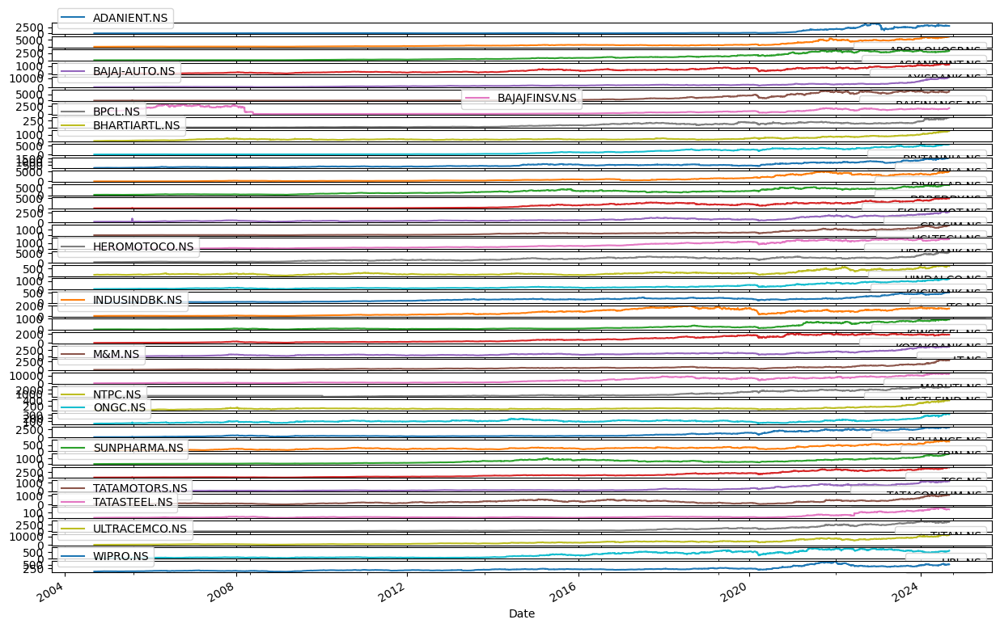

In [83]:
# Plot the closing prices for each stock
df.plot(subplots=True, figsize=(15, 10))
plt.tight_layout()
plt.show()


In [84]:
# Calculate monthly returns
monthly_returns = df.resample('M').ffill().pct_change()
monthly_returns = monthly_returns.dropna(axis=0, how='all')

# Display the monthly returns DataFrame
monthly_returns.head()


,ADANIENT.NS,APOLLOHOSP.NS,ASIANPAINT.NS,AXISBANK.NS,BAJAJ-AUTO.NS,BAJFINANCE.NS,BAJAJFINSV.NS,BPCL.NS,BHARTIARTL.NS,BRITANNIA.NS,...,SBIN.NS,SUNPHARMA.NS,TCS.NS,TATACONSUM.NS,TATAMOTORS.NS,TATASTEEL.NS,TITAN.NS,ULTRACEMCO.NS,UPL.NS,WIPRO.NS
Date,,,,,,,,,,,,,,,,,,,,,
2004-10-31,-0.006547,0.004196,-0.087158,0.178558,-0.063805,0.063926,-0.069061,-0.014375,0.074163,-0.005565,...,-0.044221,0.033201,0.128723,-0.029474,0.033478,-0.004669,0.205934,0.139823,0.003170,0.101709
2004-11-30,0.000824,0.225859,0.031749,0.087697,0.048971,0.169338,0.054893,0.134730,0.105313,0.133253,...,0.183952,0.123331,0.102398,0.082449,0.160408,0.124044,0.025205,-0.026546,0.118323,0.165627
2004-12-31,0.266667,-0.026321,0.064704,0.114320,0.121221,-0.006896,0.121221,0.182268,0.245538,0.223290,...,0.230885,0.127160,0.047699,0.066366,0.044768,0.190417,0.070992,0.153286,0.070237,-0.022964
2005-01-31,-0.021443,0.005445,0.124356,0.112581,-0.081329,0.044457,-0.081329,-0.074904,0.065403,-0.043751,...,-0.013804,-0.105742,-0.026253,0.034447,-0.001682,0.003506,-0.045691,0.009693,-0.068140,-0.058026
2005-02-28,0.015936,0.191683,-0.012227,0.174958,-0.005581,0.168478,-0.005581,0.007885,-0.022994,0.061155,...,0.111431,-0.041159,0.064751,0.114402,-0.056404,0.092638,0.162111,0.086836,-0.067178,-0.008294


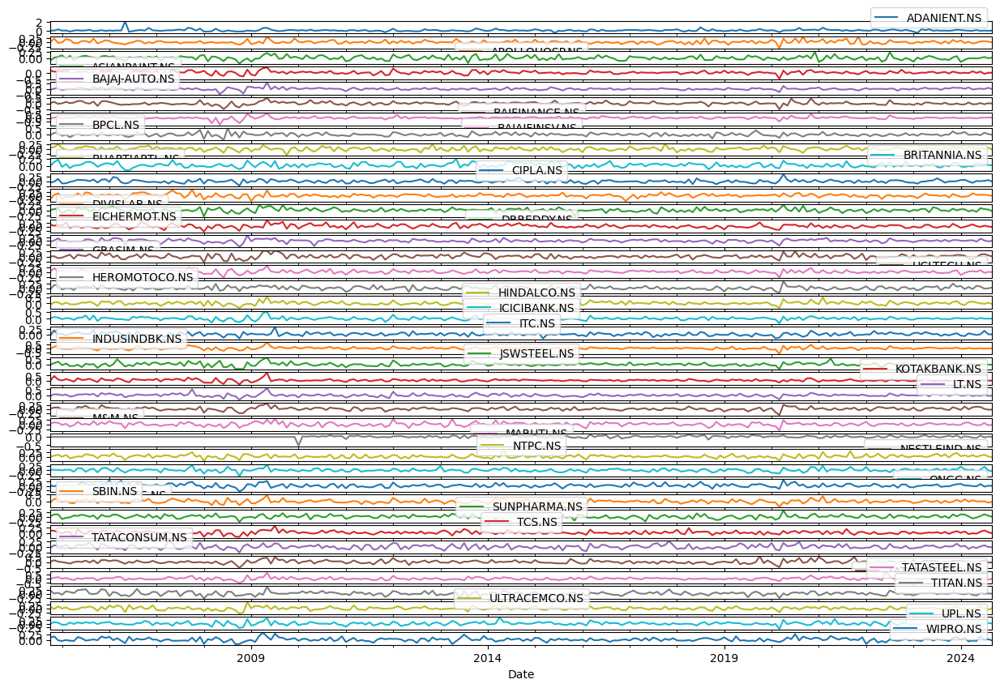

In [85]:
# Plot the monthly returns over time on separate subplots
monthly_returns.plot(subplots=True, figsize=(15, 10))
plt.tight_layout()
plt.show()


In [86]:
# Get the Fama French data
from google.colab import files
ff5 = files.upload()

Saving F-F_Research_Data_5_Factors_2x3_daily.CSV to F-F_Research_Data_5_Factors_2x3_daily (3).CSV


In [87]:
ff5_data = pd.read_csv('F-F_Research_Data_5_Factors_2x3_daily.CSV', skiprows=3,index_col=0)
ff5_data.head()

,Mkt-RF,SMB,HML,RMW,CMA,RF
19630701,-0.67,0.02,-0.35,0.03,0.13,0.012
19630702,0.79,-0.28,0.28,-0.08,-0.21,0.012
19630703,0.63,-0.18,-0.10,0.13,-0.25,0.012
19630705,0.40,0.09,-0.28,0.07,-0.30,0.012
19630708,-0.63,0.07,-0.20,-0.27,0.06,0.012


In [88]:
ff5_data = pd.DataFrame(ff5_data)
ff5_data.index = pd.to_datetime(ff5_data.index, format='%Y%m%d')
ff5_data = ff5_data.resample('M').last()
ff5_data.head()

,Mkt-RF,SMB,HML,RMW,CMA,RF
1963-07-31,-0.13,0.11,-0.03,-0.13,0.30,0.012
1963-08-31,0.44,0.15,-0.13,0.15,-0.21,0.011
1963-09-30,-0.60,0.21,0.08,0.24,0.13,0.014
1963-10-31,0.21,-0.03,0.08,0.10,-0.26,0.013
1963-11-30,1.34,0.30,0.29,-0.31,-0.15,0.015


In [90]:
# Filter ff5_data to match the time period of monthly_returns
ff5_data_subset = ff5_data[ff5_data.index.isin(monthly_returns.index)]
ff5_data_subset.head()

,Mkt-RF,SMB,HML,RMW,CMA,RF
2004-10-31,0.18,-0.49,0.25,0.03,0.01,0.005
2004-11-30,-0.37,0.21,0.16,0.23,-0.14,0.007
2004-12-31,-0.14,-0.01,0.21,-0.05,0.13,0.007
2005-01-31,0.97,0.86,0.14,-0.20,-0.11,0.008
2005-02-28,-0.61,0.22,0.05,0.40,0.17,0.009


In [91]:
# Check dimensions and date ranges
print("Dimensions of ff5_data_subset:", ff5_data_subset.shape)
print("Dimensions of monthly_returns:", monthly_returns.shape)
print("Start date of ff5_data_subset:", ff5_data_subset.index.min())
print("End date of ff5_data_subset:", ff5_data_subset.index.max())
print("Start date of monthly_returns:", monthly_returns.index.min())
print("End date of monthly_returns:", monthly_returns.index.max())


Dimensions of ff5_data_subset: (237, 6)
Dimensions of monthly_returns: (240, 41)
Start date of ff5_data_subset: 2004-10-31 00:00:00
End date of ff5_data_subset: 2024-06-30 00:00:00
Start date of monthly_returns: 2004-10-31 00:00:00
End date of monthly_returns: 2024-09-30 00:00:00


In [92]:
# Drop the last 3 entries of the monthly returns
monthly_returns = monthly_returns[:-3]


In [93]:
# Calculate excess returns
excess_returns = monthly_returns.copy()
for col in excess_returns.columns:
  excess_returns[col] = excess_returns[col] - ff5_data_subset['RF'] / 100
excess_returns.head()

,ADANIENT.NS,APOLLOHOSP.NS,ASIANPAINT.NS,AXISBANK.NS,BAJAJ-AUTO.NS,BAJFINANCE.NS,BAJAJFINSV.NS,BPCL.NS,BHARTIARTL.NS,BRITANNIA.NS,...,SBIN.NS,SUNPHARMA.NS,TCS.NS,TATACONSUM.NS,TATAMOTORS.NS,TATASTEEL.NS,TITAN.NS,ULTRACEMCO.NS,UPL.NS,WIPRO.NS
Date,,,,,,,,,,,,,,,,,,,,,
2004-10-31,-0.006597,0.004146,-0.087208,0.178508,-0.063855,0.063876,-0.069111,-0.014425,0.074113,-0.005615,...,-0.044271,0.033151,0.128673,-0.029524,0.033428,-0.004719,0.205884,0.139773,0.003120,0.101659
2004-11-30,0.000754,0.225789,0.031679,0.087627,0.048901,0.169268,0.054823,0.134660,0.105243,0.133183,...,0.183882,0.123261,0.102328,0.082379,0.160338,0.123974,0.025135,-0.026616,0.118253,0.165557
2004-12-31,0.266597,-0.026391,0.064634,0.114250,0.121151,-0.006966,0.121151,0.182198,0.245468,0.223220,...,0.230815,0.127090,0.047629,0.066296,0.044698,0.190347,0.070922,0.153216,0.070167,-0.023034
2005-01-31,-0.021523,0.005365,0.124276,0.112501,-0.081409,0.044377,-0.081409,-0.074984,0.065323,-0.043831,...,-0.013884,-0.105822,-0.026333,0.034367,-0.001762,0.003426,-0.045771,0.009613,-0.068220,-0.058106
2005-02-28,0.015846,0.191593,-0.012317,0.174868,-0.005671,0.168388,-0.005671,0.007795,-0.023084,0.061065,...,0.111341,-0.041249,0.064661,0.114312,-0.056494,0.092548,0.162021,0.086746,-0.067268,-0.008384


In [94]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(ff5_data_subset, excess_returns, test_size=0.2, shuffle=False)


In [96]:
# Fit the OLS regression model for each stock
results = {}
for stock in excess_returns.columns:
  y = y_train[stock]
  X = sm.add_constant(X_train.drop('RF', axis=1))  # Add a constant to the independent variables
  model = sm.OLS(y, X)
  results[stock] = model.fit()


In [97]:
# Print the results summary for each model
for stock, result in results.items():
  print(f"Results for {stock}:")
  print(result.summary())
  print("\n")

Results for ADANIENT.NS:
                            OLS Regression Results                            
Dep. Variable:            ADANIENT.NS   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.7076
Date:                Thu, 05 Sep 2024   Prob (F-statistic):              0.618
Time:                        11:59:23   Log-Likelihood:                 10.580
No. Observations:                 189   AIC:                            -9.161
Df Residuals:                     183   BIC:                             10.29
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0430      

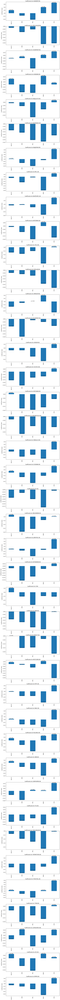

In [98]:
# Plot the coefficients for each model along with the p-values on subplots
fig, axes = plt.subplots(nrows=len(results), ncols=1, figsize=(10, 4 * len(results)))

for i, (stock, result) in enumerate(results.items()):
  ax = axes[i]
  # Get coefficients and p-values
  coefficients = result.params.drop('const')
  p_values = result.pvalues.drop('const')

  # Create bar plot for coefficients
  coefficients.plot(kind='bar', ax=ax)
  ax.set_title(f"Coefficients for {stock}")
  ax.set_ylabel("Coefficient Value")

  # Add p-values as text above the bars
  for j, p_val in enumerate(p_values):
    ax.text(j, coefficients.iloc[j], f"p={p_val:.3f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()


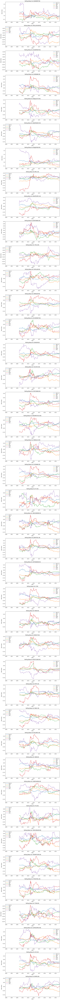

In [99]:
# Calculate rolling betas
rolling_betas = {}
window = 60  # Set the rolling window size

for stock in excess_returns.columns:
  rolling_betas[stock] = pd.DataFrame(index=excess_returns.index, columns=['Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA'])
  for i in range(window, len(excess_returns)):
    y = excess_returns[stock].iloc[i - window:i]
    X = sm.add_constant(ff5_data_subset.drop('RF', axis=1).iloc[i - window:i])
    model = sm.OLS(y, X).fit()
    rolling_betas[stock].iloc[i] = model.params.drop('const')

# Plot the rolling betas for each factor on separate subplots
fig, axes = plt.subplots(nrows=len(rolling_betas), ncols=1, figsize=(10, 4 * len(rolling_betas)))

for i, (stock, betas) in enumerate(rolling_betas.items()):
  ax = axes[i]
  betas.plot(ax=ax)
  ax.set_title(f"Rolling Betas for {stock}")
  ax.set_ylabel("Beta Value")

plt.tight_layout()
plt.show()


In [100]:
# Make predictions on the test set
predictions = {}
for stock, result in results.items():
  X_test_const = sm.add_constant(X_test.drop('RF', axis=1))  # Add constant to test set
  predictions[stock] = result.predict(X_test_const)


In [101]:
# Calculate performance metrics for each stock
performance_metrics = {}
for stock in excess_returns.columns:
  r2 = r2_score(y_test[stock], predictions[stock])
  mse = mean_squared_error(y_test[stock], predictions[stock])
  rmse = mean_squared_error(y_test[stock], predictions[stock], squared=False)
  mae = mean_absolute_error(y_test[stock], predictions[stock])
  performance_metrics[stock] = {'R-squared': r2, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}

# Calculate overall performance metrics
all_predictions = pd.concat(predictions.values(), axis=1)
all_y_test = y_test.values.flatten()
overall_r2 = r2_score(all_y_test, all_predictions.values.flatten())
overall_mse = mean_squared_error(all_y_test, all_predictions.values.flatten())
overall_rmse = mean_squared_error(all_y_test, all_predictions.values.flatten(), squared=False)
overall_mae = mean_absolute_error(all_y_test, all_predictions.values.flatten())

# Create a DataFrame to display the results
performance_df = pd.DataFrame(performance_metrics).transpose()
performance_df.loc['Overall'] = [overall_r2, overall_mse, overall_rmse, overall_mae]
print(performance_df)


               R-squared       MSE      RMSE       MAE
ADANIENT.NS     0.010597  0.031942  0.178723  0.125478
APOLLOHOSP.NS  -0.202509  0.013213  0.114946  0.088439
ASIANPAINT.NS  -0.089237  0.007021  0.083791  0.063720
AXISBANK.NS    -0.046925  0.006634  0.081448  0.063000
BAJAJ-AUTO.NS  -0.190418  0.005255  0.072490  0.057444
BAJFINANCE.NS  -0.122804  0.013036  0.114177  0.090712
BAJAJFINSV.NS   0.067729  0.013488  0.116140  0.082817
BPCL.NS        -0.244082  0.007927  0.089035  0.070839
BHARTIARTL.NS  -0.150573  0.004916  0.070113  0.053098
BRITANNIA.NS   -0.129748  0.004138  0.064331  0.055162
CIPLA.NS       -0.280920  0.004661  0.068273  0.057026
DIVISLAB.NS    -0.280714  0.009014  0.094944  0.071541
DRREDDY.NS     -0.098103  0.005709  0.075555  0.058700
EICHERMOT.NS    0.042685  0.005423  0.073638  0.061225
GRASIM.NS      -0.004757  0.004864  0.069742  0.054387
HCLTECH.NS     -0.099376  0.007342  0.085688  0.067915
HDFCBANK.NS    -0.110517  0.004167  0.064552  0.052107
HEROMOTOCO

In [102]:
# Filter stocks with positive out-of-sample R-squared values
positive_r2_stocks = performance_df[performance_df['R-squared'] > 0].index.tolist()

# Create a DataFrame to store coefficients and p-values
results_df = pd.DataFrame(index=positive_r2_stocks, columns=['Mkt-RF (coef)', 'Mkt-RF (p-val)', 'SMB (coef)', 'SMB (p-val)',
                                                            'HML (coef)', 'HML (p-val)', 'RMW (coef)', 'RMW (p-val)',
                                                            'CMA (coef)', 'CMA (p-val)'])

# Populate the DataFrame with coefficients and p-values
for stock in positive_r2_stocks:
  result = results[stock]
  results_df.loc[stock, 'Mkt-RF (coef)'] = result.params['Mkt-RF']
  results_df.loc[stock, 'Mkt-RF (p-val)'] = result.pvalues['Mkt-RF']
  results_df.loc[stock, 'SMB (coef)'] = result.params['SMB']
  results_df.loc[stock, 'SMB (p-val)'] = result.pvalues['SMB']
  results_df.loc[stock, 'HML (coef)'] = result.params['HML']
  results_df.loc[stock, 'HML (p-val)'] = result.pvalues['HML']
  results_df.loc[stock, 'RMW (coef)'] = result.params['RMW']
  results_df.loc[stock, 'RMW (p-val)'] = result.pvalues['RMW']
  results_df.loc[stock, 'CMA (coef)'] = result.params['CMA']
  results_df.loc[stock, 'CMA (p-val)'] = result.pvalues['CMA']

# Display the results DataFrame
print(results_df)


              Mkt-RF (coef) Mkt-RF (p-val) SMB (coef) SMB (p-val) HML (coef)  \
ADANIENT.NS         0.01978       0.314824  -0.016227    0.572771  -0.043219   
BAJAJFINSV.NS      0.002353       0.859834  -0.033755    0.084765  -0.059895   
EICHERMOT.NS       -0.01258       0.187593   -0.02967    0.034371  -0.002126   
HINDALCO.NS       -0.007905       0.474198  -0.027299    0.092276  -0.020175   
ITC.NS            -0.008592       0.147401  -0.003426    0.692294  -0.010009   
INDUSINDBK.NS      0.004846       0.684388  -0.039056    0.026156  -0.031615   
JSWSTEEL.NS       -0.002306       0.852482  -0.007162     0.69323  -0.029229   
ONGC.NS             0.00204       0.792435  -0.016796    0.139844  -0.018089   
TITAN.NS          -0.005431       0.564005  -0.020288    0.141885  -0.011853   

              HML (p-val) RMW (coef) RMW (p-val) CMA (coef) CMA (p-val)  
ADANIENT.NS      0.177485   0.040245    0.485398    0.06954    0.290989  
BAJAJFINSV.NS    0.006248  -0.008519    0.827509   

In [103]:
# Create trading signals based on predicted returns
trading_signals = {}
for stock in positive_r2_stocks:
  signal = np.where(predictions[stock] > 0, 1, -1)  # Buy (1) if predicted return is positive, sell (-1) otherwise
  trading_signals[stock] = pd.Series(signal, index=y_test.index)

# Print the trading signals for each stock
for stock, signals in trading_signals.items():
  print(f"Trading Signals for {stock}:")
  print(signals)
  print("\n")


Trading Signals for ADANIENT.NS:
Date
2020-07-31    1
2020-08-31    1
2020-09-30    1
2020-10-31   -1
2020-11-30    1
2020-12-31    1
2021-01-31   -1
2021-02-28    1
2021-03-31    1
2021-04-30    1
2021-05-31    1
2021-06-30    1
2021-07-31    1
2021-08-31    1
2021-09-30   -1
2021-10-31    1
2021-11-30    1
2021-12-31    1
2022-01-31    1
2022-02-28    1
2022-03-31    1
2022-04-30   -1
2022-05-31    1
2022-06-30    1
2022-07-31    1
2022-08-31    1
2022-09-30   -1
2022-10-31    1
2022-11-30    1
2022-12-31    1
2023-01-31    1
2023-02-28    1
2023-03-31    1
2023-04-30    1
2023-05-31    1
2023-06-30    1
2023-07-31    1
2023-08-31    1
2023-09-30    1
2023-10-31    1
2023-11-30    1
2023-12-31    1
2024-01-31    1
2024-02-29   -1
2024-03-31    1
2024-04-30    1
2024-05-31    1
2024-06-30    1
Freq: M, dtype: int64


Trading Signals for BAJAJFINSV.NS:
Date
2020-07-31    1
2020-08-31    1
2020-09-30    1
2020-10-31   -1
2020-11-30    1
2020-12-31   -1
2021-01-31    1
2021-02-28    1
20

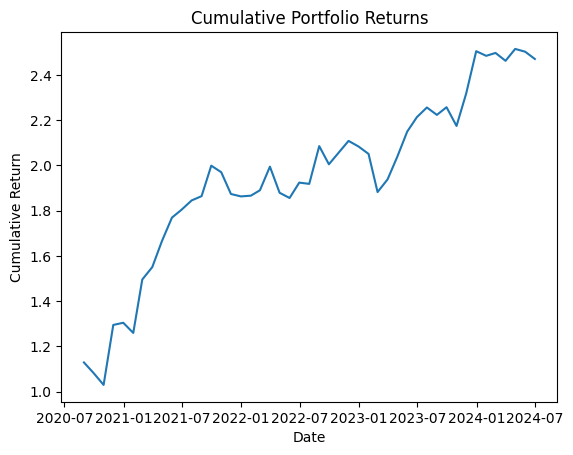

Final Portfolio Value: $ 2194462.49
Portfolio Returns: [ 0.12904951 -0.0415149  -0.04851454  0.25760141  0.00743032 -0.03445133
  0.18753269  0.03662464  0.0742488   0.06217694  0.01991546  0.02259829
  0.01030332  0.07231007 -0.01451665 -0.04886948 -0.00569778  0.00177503
  0.01280663  0.05522938 -0.05789657 -0.0122952   0.03663219 -0.00288544
  0.08702866 -0.03855609  0.02626875  0.02465679 -0.01178308 -0.01567828
 -0.08225543  0.0297728   0.05133204  0.05492364  0.02967559  0.01931146
 -0.01451888  0.01525225 -0.03672841  0.06614694  0.08059309 -0.00821142
  0.00512082 -0.01393267  0.02135183 -0.00490694 -0.0128357 ]


In [104]:
# Calculate initial investment per stock
initial_investment_per_stock = 1000000 / len(positive_r2_stocks)

# Initialize portfolio values
portfolio_values = {stock: [initial_investment_per_stock] for stock in positive_r2_stocks}

# Iterate through time and apply trading strategy
for i in range(1, len(y_test)):
  for stock in positive_r2_stocks:
    prev_value = portfolio_values[stock][-1]
    signal = trading_signals[stock].iloc[i]
    return_ = y_test[stock].iloc[i]

    if signal == 1:  # Buy
      new_value = prev_value * (1 + return_) * (1 - 0.01)  # Deduct 1% transaction cost
    elif signal == -1:  # Sell
      new_value = prev_value * (1 - return_) * (1 - 0.01)  # Deduct 1% transaction cost
    else:  # Hold
      new_value = prev_value * (1 + return_)

    portfolio_values[stock].append(new_value)

# Calculate portfolio returns
portfolio_returns = []
for i in range(1, len(y_test)):
  period_return = 0
  for stock in positive_r2_stocks:
    period_return += (portfolio_values[stock][i] - portfolio_values[stock][i - 1]) / portfolio_values[stock][i - 1]
  portfolio_returns.append(period_return / len(positive_r2_stocks))  # Average return across stocks

# Plot cumulative returns
cumulative_returns = (1 + np.array(portfolio_returns)).cumprod()
plt.plot(y_test.index[1:], cumulative_returns)
plt.title("Cumulative Portfolio Returns")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.show()

# Calculate final portfolio value
final_portfolio_value = sum(portfolio_values[stock][-1] for stock in positive_r2_stocks)
print("Final Portfolio Value: $", round(final_portfolio_value, 2))

# Return array of portfolio returns
print("Portfolio Returns:", np.array(portfolio_returns))


In [105]:
# Calculate Sharpe Ratio
excess_portfolio_returns = np.array(portfolio_returns) - ff5_data_subset['RF'].iloc[-len(portfolio_returns):] / 100
sharpe_ratio = np.mean(excess_portfolio_returns) / np.std(excess_portfolio_returns) * np.sqrt(12)  # Annualized
print("Sharpe Ratio:", sharpe_ratio)

# Calculate Max Drawdown
cumulative_returns = (1 + np.array(portfolio_returns)).cumprod()
peak = np.maximum.accumulate(cumulative_returns)
drawdowns = (cumulative_returns - peak) / peak
max_drawdown = np.min(drawdowns)
print("Max Drawdown:", max_drawdown)

# Calculate Calmar Ratio
annualized_return = (cumulative_returns[-1] ** (12 / len(cumulative_returns)) - 1)
calmar_ratio = annualized_return / abs(max_drawdown)
print("Calmar Ratio:", calmar_ratio)

# Calculate Sortino Ratio
downside_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns, 0)
downside_std = np.std(downside_returns) * np.sqrt(12)  # Annualized
sortino_ratio = np.mean(excess_portfolio_returns) / downside_std
print("Sortino Ratio:", sortino_ratio)


Sharpe Ratio: 1.2127913975672544
Max Drawdown: -0.10728839567041129
Calmar Ratio: 2.421441578394813
Sortino Ratio: 0.3222070747522532


In [106]:
# Fit the OLS regression model for each stock using only Mkt-RF, SMB, and HML
results_new = {}
for stock in excess_returns.columns:
  y = y_train[stock]
  X = sm.add_constant(X_train[['Mkt-RF', 'SMB', 'HML']])  # Use only Mkt-RF, SMB, and HML as regressors
  model = sm.OLS(y, X)
  results_new[stock] = model.fit()

# Print the results summary for each model
for stock, result in results_new.items():
  print(f"Results for {stock} (with Mkt-RF, SMB, HML):")
  print(result.summary())
  print("\n")


Results for ADANIENT.NS (with Mkt-RF, SMB, HML):
                            OLS Regression Results                            
Dep. Variable:            ADANIENT.NS   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                 -0.005
Method:                 Least Squares   F-statistic:                    0.6704
Date:                Thu, 05 Sep 2024   Prob (F-statistic):              0.571
Time:                        12:00:26   Log-Likelihood:                 9.7924
No. Observations:                 189   AIC:                            -11.58
Df Residuals:                     185   BIC:                             1.382
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
con

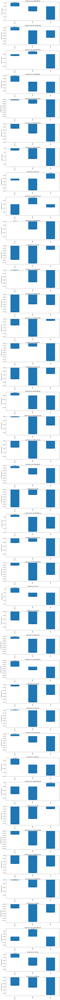

In [107]:
# Plot the coefficients for each model along with the p-values on subplots
fig, axes = plt.subplots(nrows=len(results_new), ncols=1, figsize=(10, 4 * len(results_new)))

for i, (stock, result) in enumerate(results_new.items()):
  ax = axes[i]
  # Get coefficients and p-values
  coefficients = result.params.drop('const')
  p_values = result.pvalues.drop('const')

  # Create bar plot for coefficients
  coefficients.plot(kind='bar', ax=ax)
  ax.set_title(f"Coefficients for {stock}")
  ax.set_ylabel("Coefficient Value")

  # Add p-values as text above the bars
  for j, p_val in enumerate(p_values):
    ax.text(j, coefficients.iloc[j], f"p={p_val:.3f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()


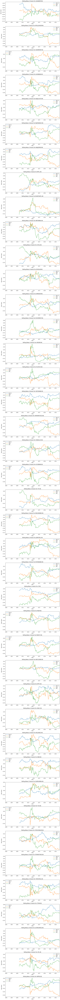

In [108]:
# Calculate rolling betas for the three-factor model
rolling_betas_3factor = {}
window = 60  # Set the rolling window size

for stock in excess_returns.columns:
  rolling_betas_3factor[stock] = pd.DataFrame(index=excess_returns.index, columns=['Mkt-RF', 'SMB', 'HML'])
  for i in range(window, len(excess_returns)):
    y = excess_returns[stock].iloc[i - window:i]
    X = sm.add_constant(ff5_data_subset[['Mkt-RF', 'SMB', 'HML']].iloc[i - window:i])
    model = sm.OLS(y, X).fit()
    rolling_betas_3factor[stock].iloc[i] = model.params.drop('const')

# Plot the rolling betas for each factor on separate subplots
fig, axes = plt.subplots(nrows=len(rolling_betas_3factor), ncols=1, figsize=(10, 4 * len(rolling_betas_3factor)))

for i, (stock, betas) in enumerate(rolling_betas_3factor.items()):
  ax = axes[i]
  betas.plot(ax=ax)
  ax.set_title(f"Rolling Betas (3-factor) for {stock}")
  ax.set_ylabel("Beta Value")

plt.tight_layout()
plt.show()


In [109]:
# Make predictions on the test set using the three-factor model
predictions_3factor = {}
for stock, result in results_new.items():
  X_test_const = sm.add_constant(X_test[['Mkt-RF', 'SMB', 'HML']])  # Use only Mkt-RF, SMB, and HML for prediction
  predictions_3factor[stock] = result.predict(X_test_const)

# Calculate performance metrics for each stock using the three-factor model
performance_metrics_3factor = {}
for stock in excess_returns.columns:
  r2 = r2_score(y_test[stock], predictions_3factor[stock])
  mse = mean_squared_error(y_test[stock], predictions_3factor[stock])
  rmse = mean_squared_error(y_test[stock], predictions_3factor[stock], squared=False)
  mae = mean_absolute_error(y_test[stock], predictions_3factor[stock])
  performance_metrics_3factor[stock] = {'R-squared': r2, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}

# Calculate overall performance metrics for the three-factor model
all_predictions_3factor = pd.concat(predictions_3factor.values(), axis=1)
overall_r2_3factor = r2_score(all_y_test, all_predictions_3factor.values.flatten())
overall_mse_3factor = mean_squared_error(all_y_test, all_predictions_3factor.values.flatten())
overall_rmse_3factor = mean_squared_error(all_y_test, all_predictions_3factor.values.flatten(), squared=False)
overall_mae_3factor = mean_absolute_error(all_y_test, all_predictions_3factor.values.flatten())

# Create a DataFrame to display the results for the three-factor model
performance_df_3factor = pd.DataFrame(performance_metrics_3factor).transpose()
performance_df_3factor.loc['Overall'] = [overall_r2_3factor, overall_mse_3factor, overall_rmse_3factor, overall_mae_3factor]
print(performance_df_3factor)


               R-squared       MSE      RMSE       MAE
ADANIENT.NS     0.045437  0.030817  0.175548  0.122868
APOLLOHOSP.NS   0.002175  0.010964  0.104707  0.078926
ASIANPAINT.NS  -0.102067  0.007104  0.084283  0.064417
AXISBANK.NS    -0.007023  0.006381  0.079881  0.060670
BAJAJ-AUTO.NS  -0.136262  0.005016  0.070822  0.056386
BAJFINANCE.NS   0.025713  0.011312  0.106358  0.081760
BAJAJFINSV.NS   0.111125  0.012861  0.113405  0.078777
BPCL.NS        -0.006727  0.006415  0.080093  0.059449
BHARTIARTL.NS   0.030039  0.004144  0.064375  0.052510
BRITANNIA.NS   -0.145723  0.004197  0.064784  0.055454
CIPLA.NS       -0.018196  0.003705  0.060870  0.049256
DIVISLAB.NS     0.016087  0.006925  0.083218  0.064395
DRREDDY.NS     -0.117728  0.005811  0.076227  0.060460
EICHERMOT.NS    0.076050  0.005234  0.072343  0.060502
GRASIM.NS      -0.020690  0.004941  0.070293  0.053714
HCLTECH.NS     -0.065484  0.007116  0.084356  0.067499
HDFCBANK.NS    -0.014122  0.003805  0.061686  0.049445
HEROMOTOCO

In [126]:
# Filter stocks with positive out-of-sample R-squared values for the 3-factor model
positive_r2_stocks_3factor = performance_df_3factor[performance_df_3factor['R-squared'] > 0].index.tolist()

# Create a new DataFrame with only positive R-squared values
positive_r2_df_3factor = performance_df_3factor.loc[positive_r2_stocks_3factor]

# Display the filtered DataFrame
print(positive_r2_df_3factor)


               R-squared       MSE      RMSE       MAE
ADANIENT.NS     0.045437  0.030817  0.175548  0.122868
APOLLOHOSP.NS   0.002175  0.010964  0.104707  0.078926
BAJFINANCE.NS   0.025713  0.011312  0.106358  0.081760
BAJAJFINSV.NS   0.111125  0.012861  0.113405  0.078777
BHARTIARTL.NS   0.030039  0.004144  0.064375  0.052510
DIVISLAB.NS     0.016087  0.006925  0.083218  0.064395
EICHERMOT.NS    0.076050  0.005234  0.072343  0.060502
HEROMOTOCO.NS   0.054449  0.005500  0.074160  0.060790
HINDALCO.NS     0.013674  0.016143  0.127055  0.098660
ITC.NS          0.036805  0.003247  0.056986  0.045179
INDUSINDBK.NS   0.147433  0.010983  0.104802  0.074771
JSWSTEEL.NS     0.024649  0.012342  0.111095  0.078297
SBIN.NS         0.032393  0.009116  0.095479  0.069118
TATACONSUM.NS   0.127881  0.004366  0.066074  0.053230
TITAN.NS        0.077388  0.005112  0.071498  0.059953
Overall         0.016345  0.008089  0.089938  0.066147


In [127]:
# Create a DataFrame to store coefficients and p-values for the 15 stocks
selected_stocks = positive_r2_df_3factor.index.tolist()[:15]  # Select the top 15 stocks
results_df_selected = pd.DataFrame(index=selected_stocks, columns=['Mkt-RF (coef)', 'Mkt-RF (p-val)', 'SMB (coef)', 'SMB (p-val)',
                                                                'HML (coef)', 'HML (p-val)'])

# Populate the DataFrame with coefficients and p-values
for stock in selected_stocks:
  result = results_new[stock]
  results_df_selected.loc[stock, 'Mkt-RF (coef)'] = result.params['Mkt-RF']
  results_df_selected.loc[stock, 'Mkt-RF (p-val)'] = result.pvalues['Mkt-RF']
  results_df_selected.loc[stock, 'SMB (coef)'] = result.params['SMB']
  results_df_selected.loc[stock, 'SMB (p-val)'] = result.pvalues['SMB']
  results_df_selected.loc[stock, 'HML (coef)'] = result.params['HML']
  results_df_selected.loc[stock, 'HML (p-val)'] = result.pvalues['HML']

# Display the results DataFrame
print(results_df_selected)


              Mkt-RF (coef) Mkt-RF (p-val) SMB (coef) SMB (p-val) HML (coef)  \
ADANIENT.NS        0.010222        0.57114  -0.014212    0.613155  -0.038193   
APOLLOHOSP.NS      0.002478       0.712707  -0.010327     0.32503  -0.005541   
BAJFINANCE.NS     -0.007828       0.443831  -0.015751    0.322854  -0.029019   
BAJAJFINSV.NS     -0.005755       0.640264  -0.027122    0.158415  -0.044647   
BHARTIARTL.NS     -0.005439       0.432923   0.003316    0.758753  -0.001646   
DIVISLAB.NS       -0.000165       0.984478  -0.007467    0.571887  -0.010919   
EICHERMOT.NS      -0.011085       0.204126   -0.03013    0.027379  -0.003235   
HEROMOTOCO.NS     -0.000943       0.884129  -0.021845    0.031282  -0.011158   
HINDALCO.NS       -0.008665       0.393428  -0.022731    0.151384  -0.009943   
ITC.NS            -0.007272       0.181037  -0.002186    0.795868  -0.007316   
INDUSINDBK.NS      0.005329        0.62499    -0.0384    0.024666  -0.030178   
JSWSTEEL.NS       -0.005867       0.6058